In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import shapefile as shp
import folium
import geopandas as gpd

import plotly as py
import plotly.offline as pyo
from plotly.offline import iplot
import plotly.graph_objs as go


https://knb.ecoinformatics.org/view/doi:10.5063/F1DN430G

Mountain Birdwatch 1.0 is a long-term monitoring program for songbirds that breed in highelevation forests of the northeastern United States. Initiated in 2000, Mountain Birdwatch has prepared skilled volunteers to conduct annual surveys along 1-km point-count routes located in Massachusetts, New York, Vermont, New Hampshire, and Maine. Primary emphasis was placed on Bicknell’s Thrush, a montane-fir specialist that breeds only in the Northeastern U.S. and adjacent portions of Canada. Other focal species included Blackpoll Warbler, Swainson’s Thrush, White-throated Sparrow, and Winter Wren. The Vermont Center for Ecostudies launched a new, revised monitoring program- Mountain Birdwatch 2.0- in June of 2010.

Focal species are species that are identified as being most sensitive to a threat in a changing environment. Species are being lost from areas in which their habitats are being destroyed, fragmented or simplified. 


Site selection was based on a GIS model of potential Bicknell’s Thrush habitat that incorporates elevation, latitude, and forest type.
However, the choice of sites was constrained by the availability of volunteers and the location of existing trails.

Survey Methods

Surveys were conducted under acceptable weather conditions (no precipitation, temperature >2 °C, wind speed <32 km/h) from 1 to 28 June. Surveys were conducted between 04:30 and 08:00 EDT and most were completed by 06:30 EDT. Observers listened quietly for ten minutes at each of five stations.

They recorded the number of each focal species seen or heard during three time periods: 0-3 minutes, 3-5 minutes, and 5-10 minutes. If Bicknell’s Thrush was not detected during or between point counts, surveyors returned to each point immediately after the full route survey and broadcast a one-minute recording of the bird’s vocalizations in order to elicit a response from present but silent birds.

In [2]:
route=pd.read_csv("JMHILL.3.4-RouteData.csv.csv")
route.head()

,ObservationNumber,SurveyID,RouteNumber,PointNumber,PrimaryPeak,RouteOwnership,MaxRouteElevation,RouteName,RouteLattitude,RouteLongitude,State
0,1,6396,145,3,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65463,-71.91207,New Hampshire
1,2,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,New Hampshire
2,3,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,New Hampshire
3,4,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,New Hampshire
4,5,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,New Hampshire


In [3]:
route.shape

(33246, 11)

In [4]:
bird=pd.read_csv("JMHILL.5.2-BirdData.csv.csv")
bird.head()

C:\Users\OMEN\Anaconda3\lib\site-packages\IPython\core\interactiveshell.py:3058: DtypeWarning:

Columns (13,15) have mixed types. Specify dtype option on import or set low_memory=False.



,ObservationNumber,ObserverID,SurveyDate,SurveyStartTime,CountLengthInMintues,Temperature,CloudCode,WindCode,AllSpeciesSurveyed,PointCountStartTime,SpeciesCode,TimePeriod,DistancetoBird,PlayBackStartTime,NumberOfBITH,SurveyNotes
0,1,OBS.127,6/1/2005,4:43,NaN,47.0,1.0,1.0,3.0,5:24,BLPW,A,NaN,7:32,0.0,NaN
1,2,OBS.127,6/1/2005,4:43,NaN,47.0,1.0,1.0,3.0,5:45,WIWR,A,NaN,6:56,0.0,NaN
2,3,OBS.127,6/1/2005,4:43,NaN,47.0,1.0,1.0,3.0,5:45,BITH,A,NaN,6:33,0.0,NaN
3,4,OBS.127,6/1/2005,4:43,NaN,47.0,1.0,1.0,3.0,5:45,WTSP,C,NaN,5:41,0.0,NaN
4,5,OBS.127,6/1/2005,4:43,NaN,47.0,1.0,1.0,3.0,5:45,WIWR,C,NaN,6:41,0.0,NaN


In [5]:
bird.shape

(33246, 16)

In [6]:
bird.columns

Index(['ObservationNumber', 'ObserverID', 'SurveyDate', 'SurveyStartTime',
       'CountLengthInMintues', 'Temperature', 'CloudCode', 'WindCode',
       'AllSpeciesSurveyed', 'PointCountStartTime', 'SpeciesCode',
       'TimePeriod', 'DistancetoBird', 'PlayBackStartTime', 'NumberOfBITH',
       'SurveyNotes'],
      dtype='object')

In [7]:
bird.SurveyNotes.value_counts()

BITH between point 1 and 2 on hike up\nBITH between point 1 and 2 during PC's                                                                                                                                                                                      80
One BITH heard calling and singing prior to starting first count. A second BITH heard calling  as approached station 2.                                                                                                                                            78
BITH heard night before survey.                                                                                                                                                                                                                                    62
BITH heard also singing after survey about 7:15. Two additional BITH heard after survey one at Pt.4 and  one near Pt.5, both calling only.                                                                            

In [8]:
bird.shape

(33246, 16)

In [9]:
species=pd.read_csv("JMHILL.6.2.csv", encoding='latin1')
species.head(10)

,SpeciesCode,CommonName,LatinName
0,ABDU,American Black Duck,Anas rubripes
1,RUGR,Ruffed Grouse,Bonasa umbellus
2,SPGR,Spruce Grouse,Falcipennis canadensis
3,COLO,Common Loon,Gavia immer
4,AMBI,American Bittern,Botaurus lentiginosus
5,SSHA,Sharp-shinned Hawk,Accipiter striatus
6,BWHA,Broad-winged Hawk,Buteo platypterus
7,RTHA,Red-tailed Hawk,Buteo jamaicensis
8,MODO,Mourning Dove,Zenaida macroura
9,BBCU,Black-billed Cuckoo,Coccyzus erythropthalmus


In [10]:
species.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91 entries, 0 to 90
Data columns (total 3 columns):
SpeciesCode    91 non-null object
CommonName     91 non-null object
LatinName      91 non-null object
dtypes: object(3)
memory usage: 2.3+ KB


In [11]:
species[species.SpeciesCode=="NONE"]

,SpeciesCode,CommonName,LatinName
89,NONE,No species detected,No species detected


In [12]:
bird.CountLengthInMintues.value_counts()

10.0    24829
5.0      4795
15.0       48
Name: CountLengthInMintues, dtype: int64

In [13]:
bird.CloudCode.value_counts()

0.0    13084
1.0     7997
2.0     6351
3.0     3491
4.0      910
5.0      167
6.0       99
Name: CloudCode, dtype: int64

In [14]:
bird.AllSpeciesSurveyed.value_counts()

1.0    18339
3.0    13138
Name: AllSpeciesSurveyed, dtype: int64

In [15]:
route.isnull().sum()

ObservationNumber       0
SurveyID                0
RouteNumber             0
PointNumber             0
PrimaryPeak             0
RouteOwnership       2946
MaxRouteElevation    2074
RouteName               0
RouteLattitude         85
RouteLongitude         85
State                   0
dtype: int64

In [16]:
route.RouteNumber.value_counts()

114     729
85      576
32      527
82      491
196     471
       ... 
1004      6
178       6
1010      5
1002      4
63        3
Name: RouteNumber, Length: 211, dtype: int64

There are 211 routes.

In [17]:
route.RouteName.value_counts().head(10)

Snow           729
Mansfield      576
Plateau        527
East           491
Ranch Brook    471
Madonna        467
Burke          464
Westmore       461
Pillsbury      436
Twin NY        401
Name: RouteName, dtype: int64

Top 10 located routes most watched for the Mountain Birdwatch program were: Snow, Mansfield, Plateau, East, Ranch Brook, Madonna, Burke, Westmore, Pillsbury, Twin NY.

In [18]:
route.State.value_counts()

Vermont          14339
New York          9258
New Hampshire     6061
Maine             3434
Massachusetts      154
Name: State, dtype: int64

In [19]:
a =route[["RouteName", "State"]]
a[a.State=="New Hampshire"]["RouteName"].value_counts()

Dixville            395
Cube                375
Wolf                333
Tecumseh            313
Cardigan            271
Carrigain           258
Starr King          245
Nancy               232
Smarts              228
Kinsman             213
Crawford            201
Moosilauke          186
Passaconaway        184
Crescent Ridge      182
Hale                173
Chocorua            172
Clay                168
Martha              160
Pierce              152
Carter              148
Lafayette           140
Cannon              139
Twin NH             139
Castle              132
Baldface            125
Moosilauke South     94
Stairs               84
Washington           83
West Royce           77
Wildcat              61
Kearsarge            53
Madison              49
Rollins              47
Cabot                45
Dickey               38
Tremont              35
Sandwich             35
Percy                30
Randolph             21
Middle Carter        21
Osceola               9
Crescent        

There are 6061 records in New Hampshire state in routes :'Cardigan', 'West Royce', 'Castle', 'Kinsman', 'Moosilauke South',
       'Wildcat', 'Cabot', 'Crescent Ridge', 'Chocorua', 'Washington',
       'Tecumseh', 'Clay', 'Carrigain', 'Crawford', 'Crescent',
       'Randolph', 'Hale', 'Lafayette', 'Moosilauke', 'Passaconaway',
       'Percy', 'Smarts', 'Starr King', 'Pierce', 'Tremont', 'Twin NH',
       'Martha', 'Baldface', 'Cube', 'Dixville', 'Nancy', 'Middle Carter',
       'Kearsarge', 'Madison', 'Sandwich', 'Stairs', 'Osceola', 'Wolf',
       'Rollins', 'Eastman', 'Cannon', 'Dickey', 'Carter'.
       
Most visited were: Dixville, Cube, Wolf, Tecumseh, Cardigan, Carrigain, Starr King, Nancy, Smarts and Kinsman from 43 routes.

In [20]:
a[a.State=="Vermont"]["RouteName"].value_counts().head(20)

Snow                 729
Mansfield            576
East                 491
Ranch Brook          471
Madonna              467
Burke                464
Westmore             461
Belvidere            396
Hunger               393
Stratton             373
Ricker               366
Camels               349
North Glastenbury    344
Brousseau            339
Equinox              327
Stark                305
GoreVT               300
Tillotson            298
Molly                287
Morse                283
Name: RouteName, dtype: int64

We find 14339 records in Vermont state with the following routes: Bromley', 'Styles', 'Madonna', 'Ricker', 'North Glastenbury',
       'Westmore', 'Ellen', 'Molly', 'Belvidere', 'Morse', 'Hunger',
       'Glastenbury', 'Snow', 'HaySouth', 'Gilpin', 'Bear Head',
       'Lookoff', 'Burke', 'Gillespie Peak', 'Ascutney', 'Bloodroot',
       'NoJay', 'Ira', 'Baby', 'Blue Ridge', 'Bluff', 'Bolton',
       'Braintree', 'Grant', 'Buckball', 'Camels', 'Carmel', 'Dewey',
       "Domey's", 'East', 'Abe', 'Gillespie Mountain', 'Glebe',
       'HayNorth', 'Heartwellville', 'Romance', 'Killington', 'Laraway',
       'Lewis', 'Lockwood', 'Mansfield', 'Monadnock', 'Monastery',
       'Mother', 'Mud', 'Pete Parent', 'Saltash', 'Scrag', 'Seneca',
       'South', 'Spruce', 'Stratton', 'Tillotson', 'Wilcox', 'Woodford',
       'Hemlock', 'Wilson', 'Deerlick', 'Buchanan', 'Dorset', 'Easthaven',
       'GoreVT', 'Westridge', 'Okemo', 'Worth', 'Equinox', 'Weatherby',
       'Ranch Brook', 'Peru', 'Stark', 'Brousseau', 'Mayo', 'Shrewsbury',
       'Big Jay', 'Jay', 'Burnt Rock'

10 Most visited : Snow, Mansfield, East, Ranch Brook, Madonna, Burke, Westmore, Belvidere, Hunger and Stratton from 81 routes.

In [21]:
a[a.State=="New York"]["RouteName"].value_counts().count()

60

We find 9258 records in New York state where the most visited routes were: Plateau, Pillsbury, Twin NY, Porter, Wright, Blue Montain, Santanoni, Pitchoff, Giant and Hopkins from  60 routes.

In [22]:
a[a.State=="Maine"]["RouteName"].value_counts()

Baldpate          390
Surplus           307
Old Speck         289
Big Squaw         232
Katahdin          228
Big Spencer       185
Whitecap          162
Carlo             161
West Kennebago    140
Abraham           133
Old Blue          132
Jackson           127
Traveler          109
Cranberry         106
Mount Blue         88
Bigelow            87
Spaulding          84
South Turner       83
Snow Mountain      78
Little Bigelow     78
Saddleback         74
Blueberry          64
East Royce         63
Tumbledown         17
Wyman South        14
Wyman North         3
Name: RouteName, dtype: int64

In [23]:
locations=route[["RouteName", "State"]].groupby(["State", "RouteName"]).size()
locations=locations.to_frame().reset_index()
locations=locations.rename({0: 'Num'}, axis=1)
locations.sort_values(by="Num", ascending=False).head(30)

,State,RouteName,Num
197,Vermont,Snow,729
177,Vermont,Mansfield,576
109,New York,Plateau,527
153,Vermont,East,491
190,Vermont,Ranch Brook,471
176,Vermont,Madonna,467
145,Vermont,Burke,464
205,Vermont,Westmore,461
107,New York,Pillsbury,436
121,New York,Twin NY,401


In [24]:
fig = go.Figure(data=go.Scatter(x=locations['RouteName'],
                                y=locations['Num'],
                                mode='markers',
                                marker_color=locations['Num'],
                                text=locations['State'])) # hover text goes here

fig.update_layout(title='Counted Routes in every State were birds were seen')
fig.show()

Text(0.5, 1, 'Number of routes in every state and their frequency')

<Figure size 1440x1440 with 0 Axes>

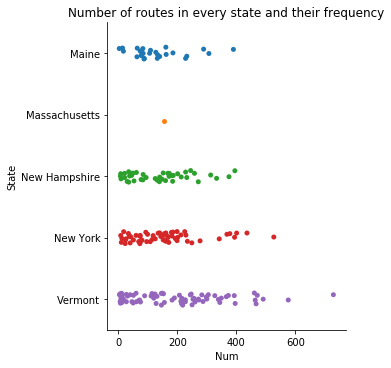

In [25]:
plt.figure(figsize=(20,20))
sns.catplot(data=locations, x="Num", y="State")
plt.title("Number of routes in every state and their frequency")

Text(0.5, 1.0, 'Number of routes in every state and their frequency')

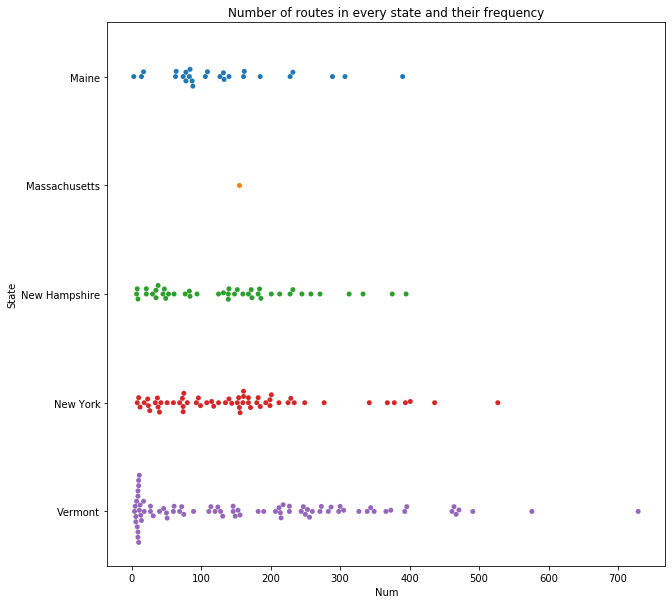

In [26]:
plt.figure(figsize=(10,10))
sns.swarmplot(data=locations, x="Num", y="State")
plt.title("Number of routes in every state and their frequency")

In [27]:
locations[locations.State == "Massachusetts"]

,State,RouteName,Num
26,Massachusetts,Greylock,154


We can observe that in Massachusetts birds were watched only in Greylock route for 154 times.

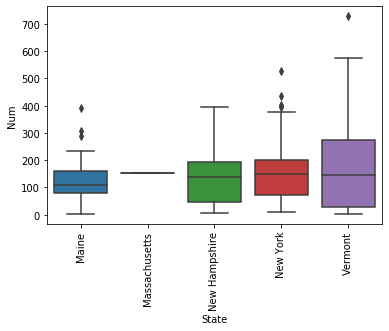

In [28]:
sns.boxplot('State','Num',data=locations)
plt.xticks(rotation='vertical')
plt.show()

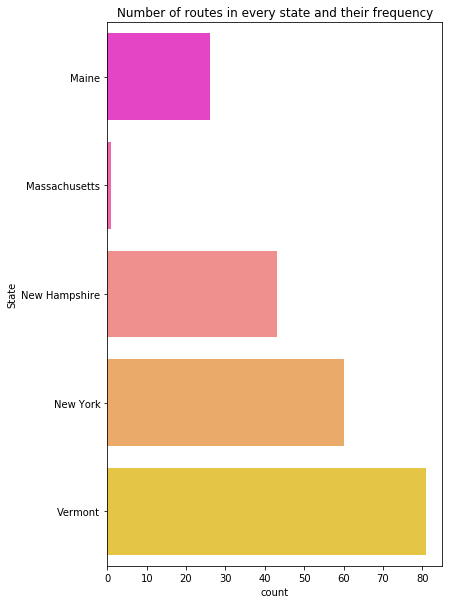

In [118]:
plt.figure(figsize=(6,10))
sns.countplot(y="State",data=locations, palette = "spring")
plt.title("Number of routes in every state and their frequency")
plt.savefig("Routes.png")

Plots show us that in Vermont we find many routes in the monitoring program with a large number of bird observations.

In [30]:
route_bird=pd.merge(route,bird,on="ObservationNumber")
route_bird

,ObservationNumber,SurveyID,RouteNumber,PointNumber,PrimaryPeak,RouteOwnership,MaxRouteElevation,RouteName,RouteLattitude,RouteLongitude,...,CloudCode,WindCode,AllSpeciesSurveyed,PointCountStartTime,SpeciesCode,TimePeriod,DistancetoBird,PlayBackStartTime,NumberOfBITH,SurveyNotes
0,1,6396,145,3,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65463,-71.91207,...,1.0,1.0,3.0,5:24,BLPW,A,NaN,7:32,0.0,NaN
1,2,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,...,1.0,1.0,3.0,5:45,WIWR,A,NaN,6:56,0.0,NaN
2,3,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,...,1.0,1.0,3.0,5:45,BITH,A,NaN,6:33,0.0,NaN
3,4,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,...,1.0,1.0,3.0,5:45,WTSP,C,NaN,5:41,0.0,NaN
4,5,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,...,1.0,1.0,3.0,5:45,WIWR,C,NaN,6:41,0.0,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33241,33617,6443,203,4,Dickey Mountain,NaN,2734.0,Dickey,43.92242,-71.57760,...,0.0,1.0,3.0,4:58,MODO,NaN,NaN,NaN,NaN,NaN
33242,33618,6443,203,4,Dickey Mountain,NaN,2734.0,Dickey,43.92242,-71.57760,...,0.0,1.0,3.0,4:58,WIWR,NaN,NaN,NaN,NaN,NaN
33243,33619,6443,203,5,Dickey Mountain,NaN,2734.0,Dickey,43.92049,-71.57637,...,0.0,1.0,3.0,5:14,WTSP,NaN,NaN,NaN,NaN,NaN
33244,33620,6443,203,5,Dickey Mountain,NaN,2734.0,Dickey,43.92049,-71.57637,...,0.0,1.0,3.0,5:14,WTSP,NaN,NaN,NaN,NaN,NaN


In [31]:
route_bird.columns

Index(['ObservationNumber', 'SurveyID', 'RouteNumber', 'PointNumber',
       'PrimaryPeak', 'RouteOwnership', 'MaxRouteElevation', 'RouteName',
       'RouteLattitude', 'RouteLongitude', 'State', 'ObserverID', 'SurveyDate',
       'SurveyStartTime', 'CountLengthInMintues', 'Temperature', 'CloudCode',
       'WindCode', 'AllSpeciesSurveyed', 'PointCountStartTime', 'SpeciesCode',
       'TimePeriod', 'DistancetoBird', 'PlayBackStartTime', 'NumberOfBITH',
       'SurveyNotes'],
      dtype='object')

In [32]:
route_bird.isnull().sum()

ObservationNumber           0
SurveyID                    0
RouteNumber                 0
PointNumber                 0
PrimaryPeak                 0
RouteOwnership           2946
MaxRouteElevation        2074
RouteName                   0
RouteLattitude             85
RouteLongitude             85
State                       0
ObserverID                386
SurveyDate                386
SurveyStartTime           497
CountLengthInMintues     3574
Temperature              2488
CloudCode                1147
WindCode                 1197
AllSpeciesSurveyed       1769
PointCountStartTime        12
SpeciesCode                10
TimePeriod               4600
DistancetoBird          18230
PlayBackStartTime       31643
NumberOfBITH            31611
SurveyNotes             29823
dtype: int64

In [33]:
route_bird[route_bird.SpeciesCode=="NONE"].count()

ObservationNumber       213
SurveyID                213
RouteNumber             213
PointNumber             213
PrimaryPeak             213
RouteOwnership          178
MaxRouteElevation       193
RouteName               213
RouteLattitude          213
RouteLongitude          213
State                   213
ObserverID              213
SurveyDate              213
SurveyStartTime         212
CountLengthInMintues    207
Temperature             186
CloudCode               213
WindCode                208
AllSpeciesSurveyed      199
PointCountStartTime     213
SpeciesCode             213
TimePeriod                0
DistancetoBird            0
PlayBackStartTime         3
NumberOfBITH              3
SurveyNotes               5
dtype: int64

In [34]:
df=route_bird.copy()
df=df[["SpeciesCode", "RouteLattitude", "RouteLongitude", "RouteName", "State"]]
df

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,43.65463,-71.91207,Cardigan,New Hampshire
1,WIWR,43.65593,-71.91094,Cardigan,New Hampshire
2,BITH,43.65593,-71.91094,Cardigan,New Hampshire
3,WTSP,43.65593,-71.91094,Cardigan,New Hampshire
4,WIWR,43.65593,-71.91094,Cardigan,New Hampshire
...,...,...,...,...,...
33241,MODO,43.92242,-71.57760,Dickey,New Hampshire
33242,WIWR,43.92242,-71.57760,Dickey,New Hampshire
33243,WTSP,43.92049,-71.57637,Dickey,New Hampshire
33244,WTSP,43.92049,-71.57637,Dickey,New Hampshire


In [35]:
df.SpeciesCode.value_counts()

WTSP    6860
BLPW    5679
SWTH    5306
WIWR    4910
BITH    2222
        ... 
PEFA       1
SWSP       1
GRSQ       1
CHSW       1
RTHU       1
Name: SpeciesCode, Length: 91, dtype: int64

In [36]:
m=folium.Map(location=[45, -69], titles="Maine", zoom_start=6)
m

Northeastern United States (Maine, New Hampshire, Vermont, New York, Massachusetts)

In [37]:
folium.Marker(location=[45.38046, -69.22999], popup="Maine", icon=folium.Icon(color='green')).add_to(m)
folium.Marker(location=[43.68556, -71.57754], popup="New Hampshire", icon=folium.Icon(color='orange')).add_to(m)
folium.Marker(location=[42.25788, -71.81423], popup="Massachusetts", icon=folium.Icon(color='gray')).add_to(m)
folium.Marker(location=[44.07511, -72.66273], popup="Vermont", icon=folium.Icon(color='darkpurple')).add_to(m)
folium.Marker(location=[42.94796, -75.51491], popup="New York", icon=folium.Icon(color='beige')).add_to(m)
m
m.save('states.html')
m

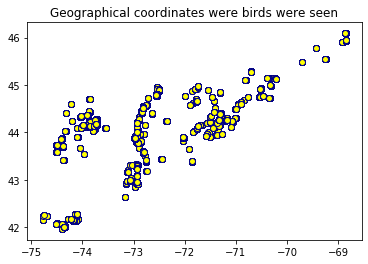

In [38]:
plt.scatter(x = df.RouteLongitude, y = df.RouteLattitude, c = 'yellow', edgecolor = 'darkblue')
plt.title("Geographical coordinates were birds were seen")
plt.show()

In [39]:
#opening the vector map
shp_path = 's_11au16.shp'
#reading the shape file by using reader function of the shape lib
sf = shp.Reader(shp_path, encoding='latin1')
len(sf.shapes())

57

In [40]:
sf.records()

[Record #0: ['AK', 'Alaska', '02', -152.24098, 64.24019],
 Record #1: ['AL', 'Alabama', '01', -86.82676, 32.79354],
 Record #2: ['AR', 'Arkansas', '05', -92.4392, 34.89977],
 Record #3: ['AS', 'American Samoa', '60', -170.37215, -14.26486],
 Record #4: ['AZ', 'Arizona', '04', -111.66457, 34.29323],
 Record #5: ['CA', 'California', '06', -119.60818, 37.24537],
 Record #6: ['CO', 'Colorado', '08', -105.54783, 38.99855],
 Record #7: ['CT', 'Connecticut', '09', -72.72623, 41.62196],
 Record #8: ['DC', 'District of Columbia', '11', -77.01464, 38.90932],
 Record #9: ['DE', 'Delaware', '10', -75.50592, 38.99559],
 Record #10: ['FL', 'Florida', '12', -82.50934, 28.67402],
 Record #11: ['GA', 'Georgia', '13', -83.44848, 32.65155],
 Record #12: ['HI', 'Hawaii', '15', -156.34743, 20.24923],
 Record #13: ['IA', 'Iowa', '19', -93.50003, 42.07463],
 Record #14: ['ID', 'Idaho', '16', -114.65933, 44.38907],
 Record #15: ['IL', 'Illinois', '17', -89.19838, 40.06501],
 Record #16: ['IN', 'Indiana', '18'

In [41]:
geo_df = gpd.read_file('s_11au16.shp')
geo_df.head(20)
geo_df2=geo_df[geo_df.NAME.isin(["Vermont", "New York", "New Hampshire", "Maine", "Massachusetts"])]
geo_df2

,STATE,NAME,FIPS,LON,LAT,geometry
20,MA,Massachusetts,25,-71.81423,42.25788,"MULTIPOLYGON (((-70.81094 41.26176, -70.81018 ..."
21,ME,Maine,23,-69.22999,45.38046,"MULTIPOLYGON (((-70.42468 43.36591, -70.42200 ..."
29,NH,New Hampshire,33,-71.57754,43.68556,"POLYGON ((-71.08420 45.30531, -71.08210 45.288..."
33,NY,New York,36,-75.51491,42.94796,"MULTIPOLYGON (((-73.72681 40.59421, -73.72669 ..."
46,VT,Vermont,50,-72.66273,44.07511,"POLYGON ((-72.83210 45.01641, -72.82570 45.016..."


In [42]:
geo_df["geometry"]

0     MULTIPOLYGON (((-179.10754 51.30120, -179.1054...
1     MULTIPOLYGON (((-88.11011 30.25891, -88.10638 ...
2     POLYGON ((-91.62986 36.49921, -91.62849 36.499...
3     MULTIPOLYGON (((-170.77310 -14.36245, -170.773...
4     POLYGON ((-110.49090 37.00361, -110.48750 37.0...
5     MULTIPOLYGON (((-118.42620 32.79973, -118.4263...
6     POLYGON ((-106.87560 41.00301, -106.85850 41.0...
7     MULTIPOLYGON (((-73.62247 40.98430, -73.62209 ...
8     MULTIPOLYGON (((-77.03097 38.80826, -77.03110 ...
9     MULTIPOLYGON (((-75.22731 38.58854, -75.22744 ...
10    MULTIPOLYGON (((-81.96339 24.52110, -81.96374 ...
11    MULTIPOLYGON (((-81.49619 30.73234, -81.49648 ...
12    MULTIPOLYGON (((-155.91200 19.18393, -155.9121...
13    MULTIPOLYGON (((-96.51620 43.04041, -96.51900 ...
14    POLYGON ((-116.06000 49.00081, -116.04919 49.0...
15    POLYGON ((-90.64000 42.50841, -90.63660 42.508...
16    POLYGON ((-86.08849 41.76071, -86.06750 41.760...
17    POLYGON ((-101.87420 40.00311, -101.86520 

In [43]:
geo_df.loc[0,'geometry']

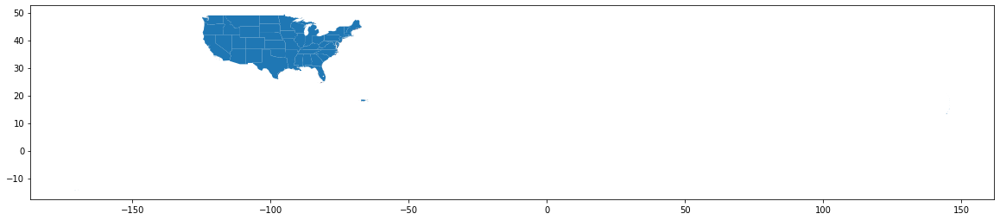

In [44]:
# Exclude Alaska and Hawaii for now
geo_df[geo_df['NAME'].isin(['Alaska','Hawaii']) == False].plot(figsize=(20,20))

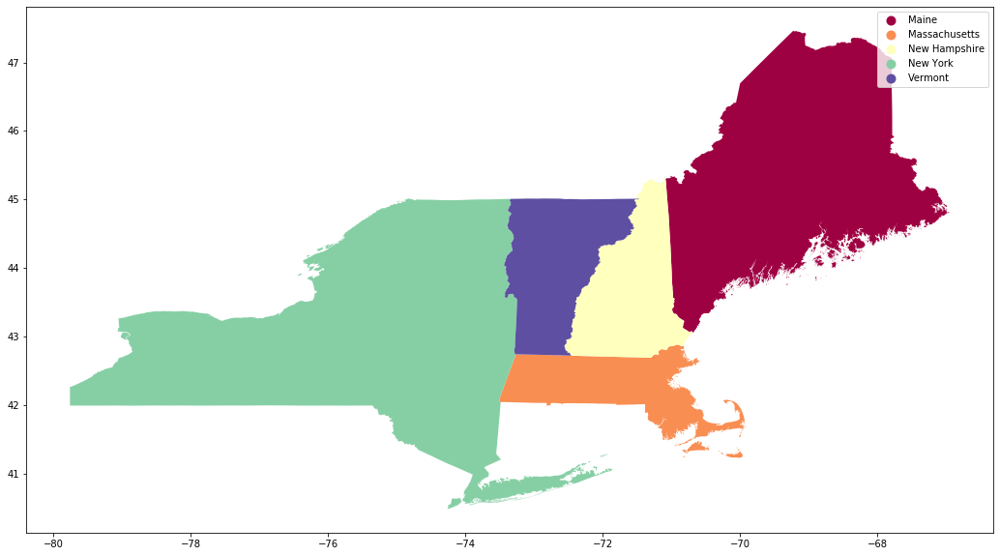

In [45]:
geo_df2.plot(column="NAME", figsize=(20,10), legend=True, cmap="Spectral")

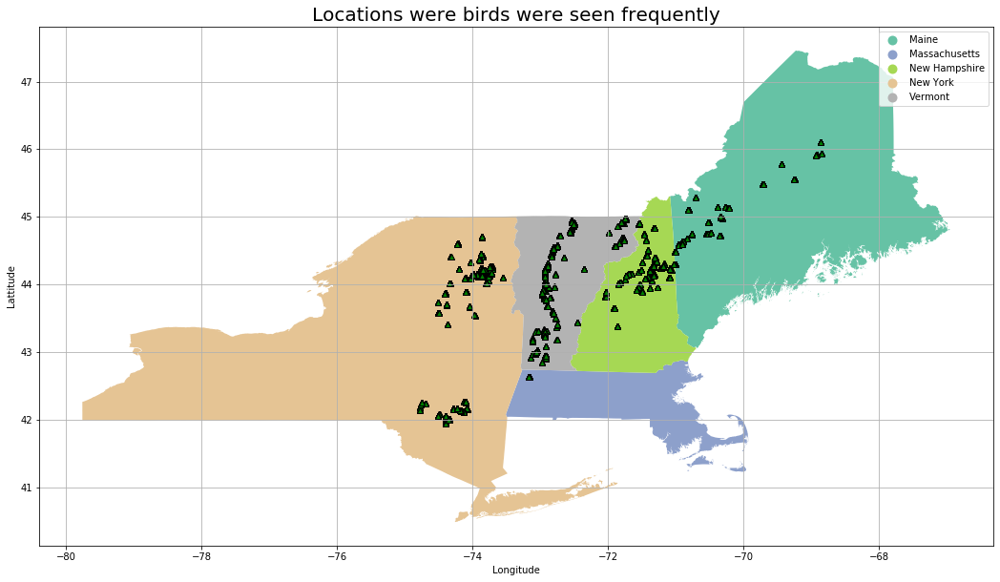

In [117]:
geo_df2.plot(column="NAME", figsize=(20,10), legend=True, cmap="Set2")

plt.scatter(x = df.RouteLongitude, y = df.RouteLattitude, c = 'green',edgecolor="black", marker="^")
plt.xlabel("Longitude")
plt.ylabel("Lattitude")
plt.grid()
plt.title("Locations were birds were seen frequently", fontsize=20)
plt.show()

In [47]:
df.head()

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,43.65463,-71.91207,Cardigan,New Hampshire
1,WIWR,43.65593,-71.91094,Cardigan,New Hampshire
2,BITH,43.65593,-71.91094,Cardigan,New Hampshire
3,WTSP,43.65593,-71.91094,Cardigan,New Hampshire
4,WIWR,43.65593,-71.91094,Cardigan,New Hampshire


In [48]:
df.SpeciesCode.value_counts().head(20)

WTSP    6860
BLPW    5679
SWTH    5306
WIWR    4910
BITH    2222
MYWA    1376
SCJU     862
MAWA     785
YBFL     644
DEJU     451
NAWA     346
YRWA     334
HETH     315
RBNU     301
GCKI     244
RESQ     213
NONE     213
AMRO     195
PUFI     189
BTNW     186
Name: SpeciesCode, dtype: int64

In [49]:
df.head()

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,43.65463,-71.91207,Cardigan,New Hampshire
1,WIWR,43.65593,-71.91094,Cardigan,New Hampshire
2,BITH,43.65593,-71.91094,Cardigan,New Hampshire
3,WTSP,43.65593,-71.91094,Cardigan,New Hampshire
4,WIWR,43.65593,-71.91094,Cardigan,New Hampshire


In [50]:
a = df[df.RouteLattitude == 41.95450]["SpeciesCode"].value_counts()
a

BLPW    4
MYWA    4
HETH    2
SWTH    2
MODO    1
REVI    1
MAWA    1
BCCH    1
SCJU    1
BLJA    1
BTNW    1
CAWA    1
Name: SpeciesCode, dtype: int64

In [51]:
df.RouteLattitude.value_counts().count()

1030

In [52]:
df.RouteLongitude.value_counts().count()

1023

In [53]:
df.RouteLongitude.isnull().sum()

85

In [54]:
df.RouteLattitude.isnull().sum()

85

In [55]:
df.isnull().sum()  # delete missing SpeciesCode and lattitude, Longitude

SpeciesCode       10
RouteLattitude    85
RouteLongitude    85
RouteName          0
State              0
dtype: int64

In [56]:
df.dropna(inplace=True) # In order to work deleting missing values I had to make a copy of dataframe above.

In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 33151 entries, 0 to 33245
Data columns (total 5 columns):
SpeciesCode       33151 non-null object
RouteLattitude    33151 non-null float64
RouteLongitude    33151 non-null float64
RouteName         33151 non-null object
State             33151 non-null object
dtypes: float64(2), object(3)
memory usage: 1.5+ MB


In [58]:
df.RouteLongitude.isnull().sum()

0

In [59]:
df.RouteLattitude.isnull().sum()

0

In [60]:
df.SpeciesCode.isnull().sum()

0

In [61]:
df.SpeciesCode.count()

33151

In [62]:
df[df.SpeciesCode =="NONE"]

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
129,NONE,45.11144,-70.81395,West Kennebago,Maine
130,NONE,45.11157,-70.81603,West Kennebago,Maine
216,NONE,43.73410,-74.50410,Wakely,New York
2023,NONE,44.26628,-73.74326,Big Crow,New York
2024,NONE,44.26555,-73.74605,Big Crow,New York
...,...,...,...,...,...
25687,NONE,44.01189,-71.84654,Moosilauke South,New Hampshire
27905,NONE,42.01190,-74.34660,Wittenberg,New York
28117,NONE,44.29867,-71.02368,West Royce,New Hampshire
28328,NONE,44.21013,-71.37568,Pierce,New Hampshire


In [63]:
species.shape

(91, 3)

In [64]:
common_names1=pd.merge(route_bird, species, on="SpeciesCode")
common_names1

,ObservationNumber,SurveyID,RouteNumber,PointNumber,PrimaryPeak,RouteOwnership,MaxRouteElevation,RouteName,RouteLattitude,RouteLongitude,...,AllSpeciesSurveyed,PointCountStartTime,SpeciesCode,TimePeriod,DistancetoBird,PlayBackStartTime,NumberOfBITH,SurveyNotes,CommonName,LatinName
0,1,6396,145,3,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65463,-71.91207,...,3.0,5:24,BLPW,A,NaN,7:32,0.0,NaN,Blackpoll Warbler,Setophaga striata
1,6,6396,145,4,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65593,-71.91094,...,3.0,5:45,BLPW,C,NaN,6:00,0.0,NaN,Blackpoll Warbler,Setophaga striata
2,7,6396,145,5,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65702,-71.90996,...,3.0,6:15,BLPW,A,NaN,6:11,0.0,NaN,Blackpoll Warbler,Setophaga striata
3,10,6396,145,5,Mount Cardigan,Cardigan State Forest,3010.0,Cardigan,43.65702,-71.90996,...,3.0,6:15,BLPW,C,NaN,6:15,0.0,NaN,Blackpoll Warbler,Setophaga striata
4,16,6442,5,2,McKenzie Mountain,ADK Park Forest Preserve,3832.0,McKenzie,44.33338,-74.03504,...,3.0,5:00,BLPW,A,NaN,5:58,0.0,NaN,Blackpoll Warbler,Setophaga striata
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33231,29285,8171,70,5,Brousseau Mountain,Hancock Timber Resource Group,2714.0,Brousseau,44.97605,-71.74137,...,1.0,6:46,BWHA,A,1.0,NaN,NaN,NaN,Broad-winged Hawk,Buteo platypterus
33232,29871,8189,99,1,Cape Lookoff Mountain,GMNF,3340.0,Lookoff,43.85500,-72.97307,...,1.0,5:00,SSHA,C,2.0,NaN,NaN,NaN,Sharp-shinned Hawk,Accipiter striatus
33233,33097,8296,78,4,Tillotson Peak,"GMC east, state west",2903.0,Tillotson,44.80603,-72.55028,...,NaN,6:01,CHSW,A,2.0,NaN,NaN,NaN,Chimney Swift,Chaetura pelagica
33234,33104,8296,78,5,Tillotson Peak,"GMC east, state west",2903.0,Tillotson,44.80937,-72.54977,...,NaN,6:28,BWWA,A,1.0,NaN,NaN,NaN,Blue-winged Warbler,Vermivora cyanoptera


In [65]:
common_names=common_names1.copy()
common_names=common_names[["SpeciesCode", "CommonName", "RouteLattitude", "RouteLongitude", "RouteName","State"]]
common_names

,SpeciesCode,CommonName,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,Blackpoll Warbler,43.65463,-71.91207,Cardigan,New Hampshire
1,BLPW,Blackpoll Warbler,43.65593,-71.91094,Cardigan,New Hampshire
2,BLPW,Blackpoll Warbler,43.65702,-71.90996,Cardigan,New Hampshire
3,BLPW,Blackpoll Warbler,43.65702,-71.90996,Cardigan,New Hampshire
4,BLPW,Blackpoll Warbler,44.33338,-74.03504,McKenzie,New York
...,...,...,...,...,...,...
33231,BWHA,Broad-winged Hawk,44.97605,-71.74137,Brousseau,Vermont
33232,SSHA,Sharp-shinned Hawk,43.85500,-72.97307,Lookoff,Vermont
33233,CHSW,Chimney Swift,44.80603,-72.55028,Tillotson,Vermont
33234,BWWA,Blue-winged Warbler,44.80937,-72.54977,Tillotson,Vermont


In [66]:
common_names.isnull().sum()

SpeciesCode        0
CommonName         0
RouteLattitude    85
RouteLongitude    85
RouteName          0
State              0
dtype: int64

In [67]:
common_names.dropna()

,SpeciesCode,CommonName,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,Blackpoll Warbler,43.65463,-71.91207,Cardigan,New Hampshire
1,BLPW,Blackpoll Warbler,43.65593,-71.91094,Cardigan,New Hampshire
2,BLPW,Blackpoll Warbler,43.65702,-71.90996,Cardigan,New Hampshire
3,BLPW,Blackpoll Warbler,43.65702,-71.90996,Cardigan,New Hampshire
4,BLPW,Blackpoll Warbler,44.33338,-74.03504,McKenzie,New York
...,...,...,...,...,...,...
33231,BWHA,Broad-winged Hawk,44.97605,-71.74137,Brousseau,Vermont
33232,SSHA,Sharp-shinned Hawk,43.85500,-72.97307,Lookoff,Vermont
33233,CHSW,Chimney Swift,44.80603,-72.55028,Tillotson,Vermont
33234,BWWA,Blue-winged Warbler,44.80937,-72.54977,Tillotson,Vermont


In [68]:
common_names.CommonName.value_counts().head(30)

White-throated Sparrow          6860
Blackpoll Warbler               5679
Swainson's Thrush               5306
Winter Wren                     4910
Bicknell's Thrush               2222
Myrtle Warbler                  1376
Slate-colored Junco              862
Magnolia Warbler                 785
Yellow-bellied Flycatcher        644
Dark-eyed Junco                  451
Nashville Warbler                346
Yellow-rumped Warbler            334
Hermit Thrush                    315
Red-breasted Nuthatch            301
Golden-crowned Kinglet           244
No species detected              213
American Red Squirrel            213
American Robin                   195
Purple Finch                     189
Black-throated Green Warbler     186
Ruby-crowned Kinglet             158
Blue-headed Vireo                130
Pine Siskin                      108
Black-capped Chickadee           105
Blue Jay                         101
Boreal Chickadee                  86
Black-throated Blue Warbler       79
U

In [69]:
common_names.CommonName.value_counts().tail(30)

Downy Woodpecker             3
Ruffed Grouse                3
American Bittern             2
Eastern Towhee               2
Wood Thrush                  2
White-crowned Sparrow        2
Blue-winged Warbler          2
Black-billed Cuckoo          2
Yellow-shafted Flicker       2
Common Loon                  2
Veery                        2
Spruce Grouse                2
House Finch                  2
Eastern Gray Squirrel        1
Tree Swallow                 1
Alder Flycatcher             1
Swamp Sparrow                1
Peregrine Falcon             1
Indigo Bunting               1
Ruby-throated Hummingbird    1
Broad-winged Hawk            1
Sharp-shinned Hawk           1
Barred Owl                   1
American Pipit               1
American Black Duck          1
Pileated Woodpecker          1
Red-tailed Hawk              1
Eastern Wood-Pewee           1
Olive-sided Flycatcher       1
Chimney Swift                1
Name: CommonName, dtype: int64

In [70]:
bp =common_names[["CommonName","RouteLattitude", "RouteLongitude"]].groupby(["CommonName","RouteLattitude", "RouteLongitude"]).size()
bp =bp.to_frame().reset_index()
bp=bp.rename({0: 'Num'}, axis=1)
bp.sort_values(by="Num", ascending=False)

,CommonName,RouteLattitude,RouteLongitude,Num
6273,White-throated Sparrow,44.21533,-73.86176,37
5879,White-throated Sparrow,42.95870,-72.92360,37
6466,White-throated Sparrow,44.53327,-72.81650,36
6271,White-throated Sparrow,44.21435,-73.86008,35
4929,Swainson's Thrush,42.95870,-72.92360,33
...,...,...,...,...
3698,Nashville Warbler,43.96493,-71.26962,1
3697,Nashville Warbler,43.96382,-71.27105,1
3696,Nashville Warbler,43.95013,-71.38058,1
3695,Nashville Warbler,43.95000,-71.37837,1


In [71]:
rs =common_names[["CommonName","RouteName", "State"]].groupby(["CommonName","RouteName", "State"]).size()
rs =rs.to_frame().reset_index()
rs=rs.rename({0: 'Num'}, axis=1)
rs.sort_values(by="Num", ascending=False)

,CommonName,RouteName,State,Num
2264,White-throated Sparrow,Porter,New York,144
2230,White-throated Sparrow,Mansfield,Vermont,142
2015,Swainson's Thrush,Snow,Vermont,128
2280,White-throated Sparrow,Snow,Vermont,121
623,Blackpoll Warbler,Snow,Vermont,118
...,...,...,...,...
1390,Nashville Warbler,Phelps,New York,1
1388,Nashville Warbler,Old Speck,Maine,1
1387,Nashville Warbler,NoJay,Vermont,1
1382,Nashville Warbler,Mansfield,Vermont,1


In [72]:
fig = go.Figure(data=go.Scatter(x=rs['CommonName'],
                                y=rs['Num'],
                                mode='markers',
                                marker_color=rs['Num'],
                                text=rs['State'])) 

fig.update_layout(title='Species of birds located by state', width=1000, height=800)
fig.show()

In [73]:
abp=bp.copy()
abp.head()

,CommonName,RouteLattitude,RouteLongitude,Num
0,Alder Flycatcher,43.65081,-71.91550,1
1,American Bittern,43.86814,-74.41155,1
2,American Bittern,44.60342,-74.22050,1
3,American Black Duck,44.11166,-71.39995,1
4,American Crow,42.95460,-72.92510,1


In [74]:
abp.RouteLattitude=abp.RouteLattitude.astype(str)

In [75]:
abp.RouteLattitude.dtype

dtype('O')

In [76]:
abp.RouteLongitude=abp.RouteLongitude.astype(str)

In [77]:
abp.RouteLongitude.dtype

dtype('O')

In [78]:
abp['Geo'] = abp[['RouteLattitude', 'RouteLongitude']].apply(lambda x: ','.join(x), axis=1)

In [79]:
abp['Geo']

0                  43.65081,-71.9155
1       43.868140000000004,-74.41155
2                  44.60342,-74.2205
3                 44.11166,-71.39995
4                   42.9546,-72.9251
                    ...             
8067               45.77731,-69.4427
8068              45.77831,-69.44343
8069              45.77961,-69.44295
8070    44.269020000000005,-73.73898
8071               44.6986,-71.78912
Name: Geo, Length: 8072, dtype: object

In [80]:
abp.head()

,CommonName,RouteLattitude,RouteLongitude,Num,Geo
0,Alder Flycatcher,43.65081,-71.9155,1,"43.65081,-71.9155"
1,American Bittern,43.868140000000004,-74.41155,1,"43.868140000000004,-74.41155"
2,American Bittern,44.60342,-74.2205,1,"44.60342,-74.2205"
3,American Black Duck,44.11166,-71.39995,1,"44.11166,-71.39995"
4,American Crow,42.9546,-72.9251,1,"42.9546,-72.9251"


In [81]:
fig = go.Figure(data=go.Scatter(x=abp['CommonName'],
                                y=abp['Num'],
                                mode='markers',
                                marker_color=abp['Num'],
                                text=abp["Geo"])) 
    

fig.update_layout(title='Counted birds located by geographical coordinates', width=1000, height=800)
fig.show()

In [82]:
fig = go.Figure(data=go.Scatter(x=abp['CommonName'],
                                y=abp['Num'],
                                mode='markers',
                                marker_color=abp['Num'],
                                text=abp['Geo'],
                                marker_size=abp['Num'])) # hover text goes here

fig.update_layout(title='Counted birds located by geographical coordinates', width=1000, height=1300)
fig.show()

In [83]:
crs=rs.copy()
crs.head()

,CommonName,RouteName,State,Num
0,Alder Flycatcher,Cardigan,New Hampshire,1
1,American Bittern,Blue Mountain,New York,1
2,American Bittern,Debar,New York,1
3,American Black Duck,Nancy,New Hampshire,1
4,American Crow,Big Crow,New York,1


In [84]:
crs['Location'] = crs[['RouteName', 'State']].apply(lambda x: ','.join(x), axis=1)

In [85]:
crs.head()

,CommonName,RouteName,State,Num,Location
0,Alder Flycatcher,Cardigan,New Hampshire,1,"Cardigan,New Hampshire"
1,American Bittern,Blue Mountain,New York,1,"Blue Mountain,New York"
2,American Bittern,Debar,New York,1,"Debar,New York"
3,American Black Duck,Nancy,New Hampshire,1,"Nancy,New Hampshire"
4,American Crow,Big Crow,New York,1,"Big Crow,New York"


In [86]:
fig = go.Figure(data=go.Scatter(x=crs['CommonName'],
                                y=crs['Num'],
                                mode='markers',
                                marker_color=crs['Num'],
                                text=crs['Location'])) 

fig.update_layout(title='Counted Species of birds located by Route and State', width=1000, height=800)
fig.show()

In [87]:
species

,SpeciesCode,CommonName,LatinName
0,ABDU,American Black Duck,Anas rubripes
1,RUGR,Ruffed Grouse,Bonasa umbellus
2,SPGR,Spruce Grouse,Falcipennis canadensis
3,COLO,Common Loon,Gavia immer
4,AMBI,American Bittern,Botaurus lentiginosus
...,...,...,...
86,AMGO,American Goldfinch,Spinus tristis
87,UNBI,Unidentified bird,Unknown bird
88,GRSQ,Eastern Gray Squirrel,Sciurus carolinensis
89,NONE,No species detected,No species detected


In [88]:
species[species.SpeciesCode=="BITH"]

,SpeciesCode,CommonName,LatinName
43,BITH,Bicknell's Thrush,Catharus bicknelli


In [89]:
species.SpeciesCode.sort_values()

0     ABDU
24    ALFL
4     AMBI
30    AMCR
86    AMGO
      ... 
84    WWCR
23    YBFL
13    YBSA
66    YRWA
17    YSFL
Name: SpeciesCode, Length: 91, dtype: object

In [90]:
df.head()

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
0,BLPW,43.65463,-71.91207,Cardigan,New Hampshire
1,WIWR,43.65593,-71.91094,Cardigan,New Hampshire
2,BITH,43.65593,-71.91094,Cardigan,New Hampshire
3,WTSP,43.65593,-71.91094,Cardigan,New Hampshire
4,WIWR,43.65593,-71.91094,Cardigan,New Hampshire


In [91]:
df[df['SpeciesCode'].str.contains('HA')]

,SpeciesCode,RouteLattitude,RouteLongitude,RouteName,State
438,HAWO,44.09786,-73.54803,Belfry,New York
444,HAWO,44.09786,-73.54803,Belfry,New York
12979,HAWO,44.15670,-73.98390,Wright,New York
13492,HAWO,43.89787,-74.09499,Vanderwhacker,New York
13867,HAWO,44.09740,-74.11140,Santanoni,New York
16828,HAWO,44.26653,-73.74000,Big Crow,New York
17070,RTHA,44.09081,-71.44060,Carrigain,New Hampshire
18046,HAWO,43.86011,-72.97539,Lookoff,Vermont
18055,HAWO,43.86151,-72.97718,Lookoff,Vermont
18565,HAWO,44.00562,-72.92403,Wilson,Vermont


In [92]:
bp.CommonName.value_counts().head(10)

White-throated Sparrow       907
Winter Wren                  900
Blackpoll Warbler            890
Swainson's Thrush            855
Bicknell's Thrush            550
Myrtle Warbler               337
Slate-colored Junco          309
Magnolia Warbler             273
Yellow-bellied Flycatcher    254
Dark-eyed Junco              216
Name: CommonName, dtype: int64

In [93]:
bp[bp.CommonName =="White-throated Sparrow"].sort_values(by="Num", ascending=False).head()

,CommonName,RouteLattitude,RouteLongitude,Num
6273,White-throated Sparrow,44.21533,-73.86176,37
5879,White-throated Sparrow,42.95870,-72.92360,37
6466,White-throated Sparrow,44.53327,-72.81650,36
6271,White-throated Sparrow,44.21435,-73.86008,35
6467,White-throated Sparrow,44.54567,-72.81169,31


In [94]:
bp[bp.CommonName =="Winter Wren"].sort_values(by="Num", ascending=False).head()

,CommonName,RouteLattitude,RouteLongitude,Num
7373,Winter Wren,44.52632,-72.81863,23
7377,Winter Wren,44.53327,-72.81650,22
7374,Winter Wren,44.52756,-72.81680,21
7372,Winter Wren,44.52340,-72.81057,20
7264,Winter Wren,44.28822,-72.88516,20


In [95]:
bp[bp.CommonName =="Blackpoll Warbler"].sort_values(by="Num", ascending=False).head()

,CommonName,RouteLattitude,RouteLongitude,Num
1565,Blackpoll Warbler,44.21246,-73.85689,31
1200,Blackpoll Warbler,42.95870,-72.92360,28
1199,Blackpoll Warbler,42.95690,-72.92490,25
1197,Blackpoll Warbler,42.95250,-72.92510,24
1712,Blackpoll Warbler,44.41676,-72.83028,23


In [96]:
bp[bp.CommonName =="Swainson's Thrush"].sort_values(by="Num", ascending=False).head()

,CommonName,RouteLattitude,RouteLongitude,Num
4929,Swainson's Thrush,42.95870,-72.92360,33
5426,Swainson's Thrush,44.41676,-72.83028,29
5290,Swainson's Thrush,44.21533,-73.86176,28
4927,Swainson's Thrush,42.95460,-72.92510,28
5500,Swainson's Thrush,44.60130,-70.90850,27


In [97]:
bp[bp.CommonName =="Bicknell's Thrush"].sort_values(by="Num", ascending=False).head()

,CommonName,RouteLattitude,RouteLongitude,Num
671,Bicknell's Thrush,44.53327,-72.81650,27
300,Bicknell's Thrush,42.13749,-74.17474,25
668,Bicknell's Thrush,44.52756,-72.81680,25
301,Bicknell's Thrush,42.13897,-74.17250,24
394,Bicknell's Thrush,43.87244,-74.40093,23


Below you can see a map with top 5 birds with geographical points where they were seen most frequent.

In [98]:
m1=folium.Map(location=[43, -73], zoom_start=7)
folium.Marker(location=[44.21533, -73.86176], popup="White-throated Sparrow", icon=folium.Icon(color='green')).add_to(m1)
folium.Marker(location=[44.53327, -72.81650], popup="White-throated Sparrow", icon=folium.Icon(color='green')).add_to(m1)
folium.Marker(location=[44.21435, -73.86008], popup="White-throated Sparrow", icon=folium.Icon(color='green')).add_to(m1)
folium.Marker(location=[44.28822, -72.88516], popup="Winter Wren", icon=folium.Icon(color='orange')).add_to(m1)
folium.Marker(location=[44.41676, -72.83028], popup="Blackpoll Warbler", icon=folium.Icon(color='darkblue')).add_to(m1)
folium.Marker(location=[42.95250, -72.92510], popup="Blackpoll Warbler", icon=folium.Icon(color='darkblue')).add_to(m1)
folium.Marker(location=[44.60130, -70.90850], popup="Swainson's Thrush", icon=folium.Icon(color='darkpurple')).add_to(m1)
folium.Marker(location=[43.87244, -74.40093], popup="Bicknell's Thrush", icon=folium.Icon(color='red')).add_to(m1)

m1.save('Top5_birds.html')
m1

In [99]:
bp.CommonName.value_counts().tail(20)

Barred Owl                   1
Olive-sided Flycatcher       1
Swamp Sparrow                1
Eastern Gray Squirrel        1
Red-tailed Hawk              1
Pileated Woodpecker          1
Common Loon                  1
Chimney Swift                1
American Pipit               1
Eastern Towhee               1
Alder Flycatcher             1
Tree Swallow                 1
Wood Thrush                  1
Indigo Bunting               1
Ruby-throated Hummingbird    1
Peregrine Falcon             1
Sharp-shinned Hawk           1
American Black Duck          1
Eastern Wood-Pewee           1
Broad-winged Hawk            1
Name: CommonName, dtype: int64

In the next plot I choose the following big birds to map that were noticed once:
    - Red-tailed Hawk
    - Peregrine Falcon
    - Sharp-shinned Hawk 
    - Broad-winged Hawk 
    - Barred Owl


In [100]:
bp[bp.CommonName =="Red-tailed Hawk"]

,CommonName,RouteLattitude,RouteLongitude,Num
4424,Red-tailed Hawk,44.09081,-71.4406,1


In [101]:
bp[bp.CommonName =="Peregrine Falcon"]

,CommonName,RouteLattitude,RouteLongitude,Num
4045,Peregrine Falcon,44.96796,-71.7396,1


In [102]:
bp[bp.CommonName =="Sharp-shinned Hawk"]

,CommonName,RouteLattitude,RouteLongitude,Num
4543,Sharp-shinned Hawk,43.855,-72.97307,1


In [103]:
bp[bp.CommonName =="Broad-winged Hawk"]

,CommonName,RouteLattitude,RouteLongitude,Num
2224,Broad-winged Hawk,44.97605,-71.74137,1


In [104]:
bp[bp.CommonName =="Barred Owl"]

,CommonName,RouteLattitude,RouteLongitude,Num
266,Barred Owl,44.1567,-73.9839,1


In [105]:
m2=folium.Map(location=[45, -71], zoom_start=7)
folium.Marker(location=[44.09081, -71.4406], popup="Red-tailed Hawk", icon=folium.Icon(color='darkred')).add_to(m2)
folium.Marker(location=[44.96796, -71.7396], popup="Peregrine Falcon", icon=folium.Icon(color='green')).add_to(m2)
folium.Marker(location=[43.855, -72.97307], popup="Sharp-shinned Hawk", icon=folium.Icon(color='beige')).add_to(m2)
folium.Marker(location=[45, -71.8], popup="Broad-winged Hawk", icon=folium.Icon(color='orange')).add_to(m2)
folium.Marker(location=[44.1567, -73.9839], popup="Barred Owl", icon=folium.Icon(color='gray')).add_to(m2)
m2.save('Hawks_Falcon_Owl.html')
m2